# Co-add spectra along nebular axis

In [1]:
from pathlib import Path
import yaml
import numpy as np
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.convolution import Gaussian2DKernel, convolve_fft
from matplotlib import pyplot as plt
import seaborn as sns

import mes_longslit as mes

/Users/will/Dropbox/teresa-pn-ou5/.venv/lib/python3.11/site-packages/FITS_tools/__init__.py:33: UserWarning: module 'astropy.config.configuration' has no attribute 'update_default_config', which has been deprecated in astropy 6.1.1.
  warn(wmsg)


In [2]:
dpath = Path.cwd().parent / "data"
pvpath = dpath / "pvextract"

In [3]:
slit_db_list = yaml.safe_load(
    (dpath / "slits-ha.yml").read_text()
)

Find list of all ha slits that are close to axis. Use ones that mention "center" in their comments.

In [4]:
id_list = [_["slit_id"] for _ in slit_db_list if "center" in _["comment"]]

In [5]:
id_list

['N10036',
 'N20012',
 'spm0048o',
 'spm0054o',
 'spm0105o',
 'spm0211o',
 'spm0432o']

In [6]:
_id = id_list[0]

In [7]:
hdu, = fits.open(pvpath / f"{_id}-ha.fits")

In [8]:
w = WCS(hdu.header, key="A")
w

WCS Keywords

Number of WCS axes: 3
CTYPE : 'AWAV' 'RA---TAN' 'DEC--TAN' 
CRVAL : 6.5577767803892e-07 318.58461345881 43.645363660227 
CRPIX : 1.0 1.0 1.0 
PC1_1 PC1_2 PC1_3  : 1.0 0.0 0.0 
PC2_1 PC2_2 PC2_3  : 0.0 -0.0039645479926298 -0.99999214114873 
PC3_1 PC3_2 PC3_3  : 0.0 0.99999214114873 -0.0039645479926298 
CDELT : 5.466290563345e-12 9.7371246546866e-05 9.7371246546866e-05 
NAXIS : 183  998  1

In [9]:
w.wcs.restwav

6.56279e-07

In [10]:
hdu.header["WEIGHT"]

0.5956792141544897

In [11]:
w0 = WCS(hdu.header).sub(2)
w0

WCS Keywords

Number of WCS axes: 2
CTYPE : 'LINEAR' 'LINEAR' 
CRVAL : 6557.7767803892 0.0 
CRPIX : 1.0 481.10893041177 
CD1_1 CD1_2  : 1.0 0.0 
CD2_1 CD2_2  : 0.0 0.0546629056334496 
NAXIS : 183  998

[]

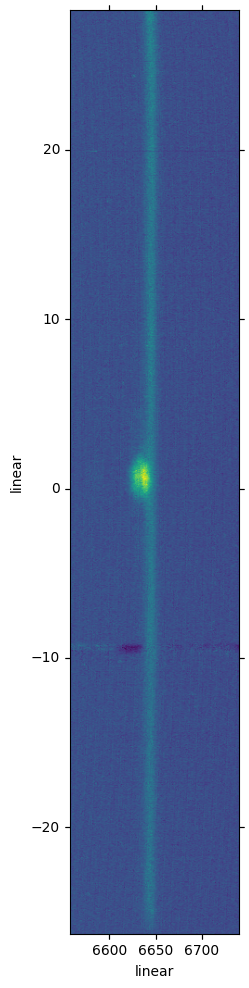

In [12]:
fig, ax = plt.subplots(
    figsize=(5, 12),
    subplot_kw=dict(projection=w0)
)
ax.imshow(hdu.data[0])
ax.set(
#    ylim=[-10, 10],
)

In [13]:
T = ax.get_transform("world")

In [14]:
T.transform_point([6563.0, 0])

array([176.83342176, 576.97259689])

In [15]:
c0 = SkyCoord("21 14 20.03 +43 41 36.0", unit=(u.hourangle, u.deg))
c0.ra.deg, c0.dec.deg

(318.58345833333334, 43.69333333333333)

In [16]:
mes.convert_pv_offset_vels(c0.ra.deg, c0.dec.deg, line_id="ha", verbose=True)

Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0105o-ha.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0105o-ha-PA000-sep-003.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0440o-ha.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0440o-ha-PA085-sep+000.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0054o-ha.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0054o-ha-PA000-sep+000.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0211o-ha.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0211o-ha-PA000-sep+000.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0048o-ha.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0048o-ha-PA000-sep+001.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/N10036-ha.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/N10036-ha-PA3

In [17]:
mes.convert_pv_offset_vels(c0.ra.deg, c0.dec.deg, line_id="oiii", verbose=True)

Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/N10045-oiii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/N10045-oiii-PA359-sep+005.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/N10039-oiii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/N10039-oiii-PA359-sep+002.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0056o-oiii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0056o-oiii-PA000-sep+000.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/N20006-oiii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/N20006-oiii-PA359-sep+004.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0023o-oiii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0023o-oiii-PA000-sep+008.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0050o-oiii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/s

In [18]:
mes.convert_pv_offset_vels(c0.ra.deg, c0.dec.deg, line_id="heii", verbose=True)

Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0105o-heii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0105o-heii-PA000-sep-003.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/N10036-heii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/N10036-heii-PA359-sep+002.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0440o-heii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0440o-heii-PA085-sep+000.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0021o-heii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0021o-heii-PA000-sep+008.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/N20004-heii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/N20004-heii-PA359-sep+004.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0215o-heii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-ve

In [19]:
mes.convert_pv_offset_vels(c0.ra.deg, c0.dec.deg, line_id="nii", verbose=True)

Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0440o-nii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0440o-nii-PA085-sep+000.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0021o-nii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0021o-nii-PA000-sep+008.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0601o-nii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0601o-nii-PA000-sep-006.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0211o-nii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0211o-nii-PA000-sep+000.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0105o-nii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0105o-nii-PA000-sep-003.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/N10036-nii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/N1

In [20]:
pvpath = dpath / "pv-offset-vels"

In [21]:
def fkey(filepath):
    "Extract integer slit offset for sorting"
    stem = str(filepath.stem).replace("-regrid", "")
    return int(stem[-4:])

In [22]:
file_list = sorted(pvpath.glob("*-oiii-*.fits"), key=fkey)
[_.stem for _ in file_list]

['spm0107o-oiii-PA000-sep-002',
 'spm0056o-oiii-PA000-sep+000',
 'N10039-oiii-PA359-sep+002',
 'spm0050o-oiii-PA000-sep+003',
 'N20006-oiii-PA359-sep+004',
 'N10045-oiii-PA359-sep+005',
 'spm0023o-oiii-PA000-sep+008']

In [23]:
id_list

['N10036',
 'N20012',
 'spm0048o',
 'spm0054o',
 'spm0105o',
 'spm0211o',
 'spm0432o']

Look at a single slit

In [24]:
hdu, = fits.open(file_list[3])

In [25]:
w = WCS(hdu.header)
w

WCS Keywords

Number of WCS axes: 2
CTYPE : 'VHEL' 'LINEAR' 
CRVAL : -284.80661705145 0.0 
CRPIX : 1.0 317.0 
PC1_1 PC1_2  : 1.0 0.0 
PC2_1 PC2_2  : 0.0 1.0 
CDELT : 3.8591890042708 0.52596317763292 
NAXIS : 155  655

In [26]:
hdu.header["OFFSET"], hdu.header["WEIGHT"]

(3.0138791711125124, 3.57475841997416)

[(44.51883980321227, 85.97832774820145),
 (258.9617865360575, 373.0382134639425)]

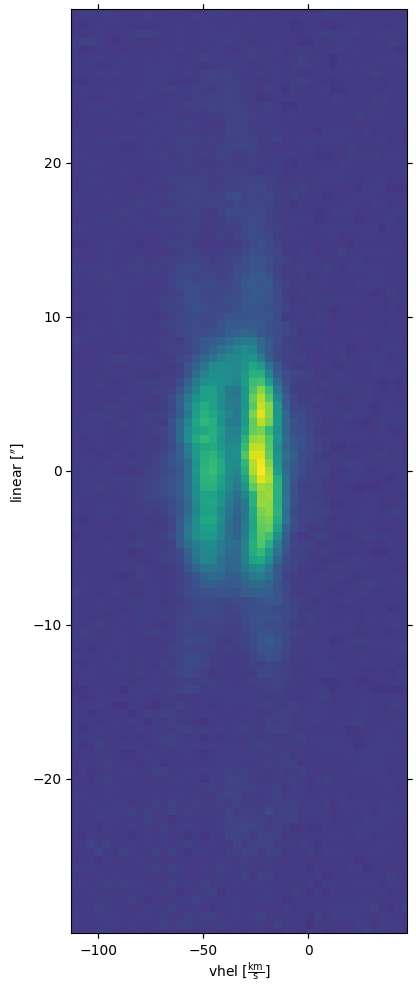

In [27]:
fig, ax = plt.subplots(
    figsize=(5, 12),
    subplot_kw=dict(projection=w)
)

vsys = -33
v1, v2 = vsys - 80, vsys + 80
s1, s2 = -30, 30
xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])

y1, y2 = [int(_) for _ in ylims]
bg1 = np.median(hdu.data[y1-10:y1+10], axis=0)
bg2 = np.median(hdu.data[y2-10:y2+10], axis=0)
im = hdu.data - 0.5 * (bg1 + bg2)
ax.imshow(im)
ax.set(
    xlim=xlims,
    ylim=ylims,
)

## Look at all the [O III] slits

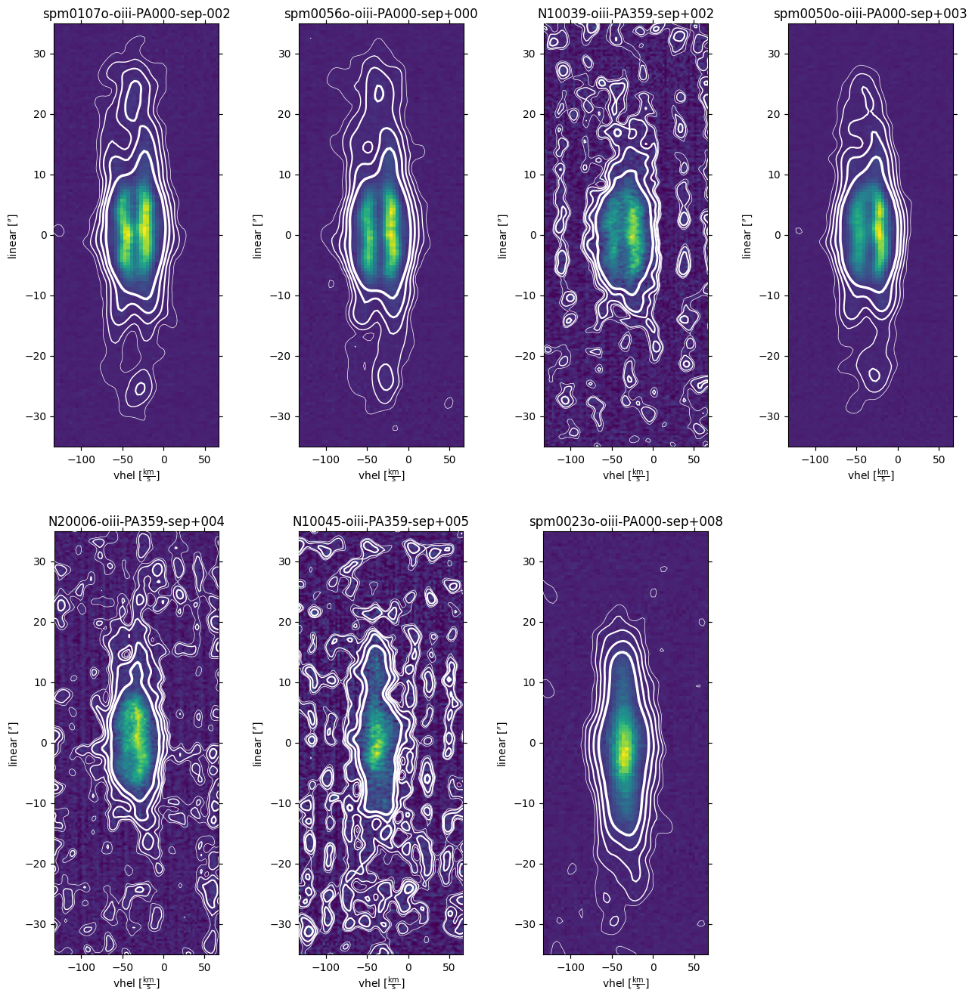

In [28]:
file_list = sorted(pvpath.glob("*-oiii-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(4 * ncols, 8 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=2.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    bg1 = np.median(hdu.data[y1-10:y1+10], axis=0)
    bg2 = np.median(hdu.data[y2-10:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    im /= im.max()
    ax.imshow(im, vmin=-0.1, vmax=1.0)
    ims = convolve_fft(im, kernel)
    ax.contour(
        ims, 
        levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
        colors="w",
        linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    )

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem)
...;

Regrid all the oiii slits and save to files

In [29]:
pvpath2 = pvpath.parent / "pv-common"
pvpath2.mkdir(exist_ok=True)

In [30]:
for filepath in file_list:
    hdu, = fits.open(filepath)
    # Use output pixels of 2 km/s by 1 arcsec
    hdu2 = mes.regrid_pv(hdu, pixscale=(2.0, 1.0))
    filepath2 = pvpath2 / f"{filepath.stem}-regrid.fits" 
    hdu2.writeto(filepath2, overwrite=True)

Take a look at the new regridded PV spectra

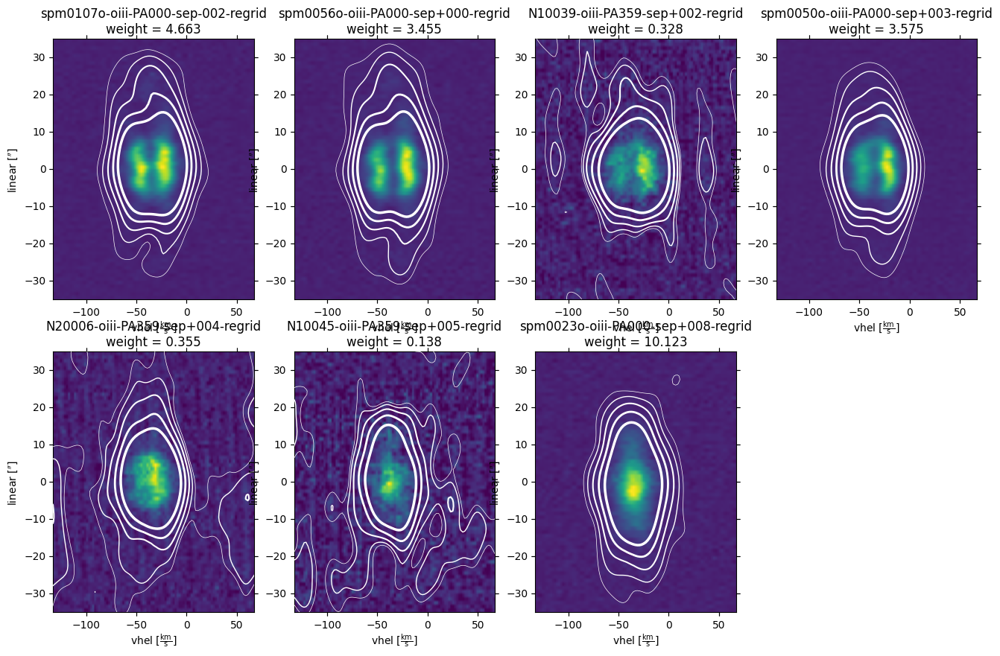

In [31]:
file_list = sorted(pvpath2.glob("*-oiii-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(4 * ncols, 5 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=4.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    bg1 = np.median(hdu.data[y1-10:y1+10], axis=0)
    bg2 = np.median(hdu.data[y2-10:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    im /= im.max()
    ax.imshow(im, vmin=-0.1, vmax=1.0, aspect="auto")
    ims = convolve_fft(im, kernel)
    ax.contour(
        ims, 
        levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
        colors="w",
        linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    )

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem + f"\nweight = {hdu.header['WEIGHT']:.3f}")
...;

This looks good, except for the noise, which has gone a bit weird.  Now we choose the best spectra tho combine. 

Looks like first 4

In [32]:
selected = 0, 1, 2, 3
imlist = []
weightsum = 0.0

for isel in selected:
    hdu, = fits.open(file_list[isel])
    weight =  hdu.header["WEIGHT"]
    imlist.append(weight * hdu.data)
    weightsum += weight
    
hdu.data = np.sum(np.stack(imlist, axis=0), axis=0) / weightsum
hdu.writeto(pvpath2 / "oiii-pv-coadd.fits", overwrite=True)




## Repeat for all the Ha slits

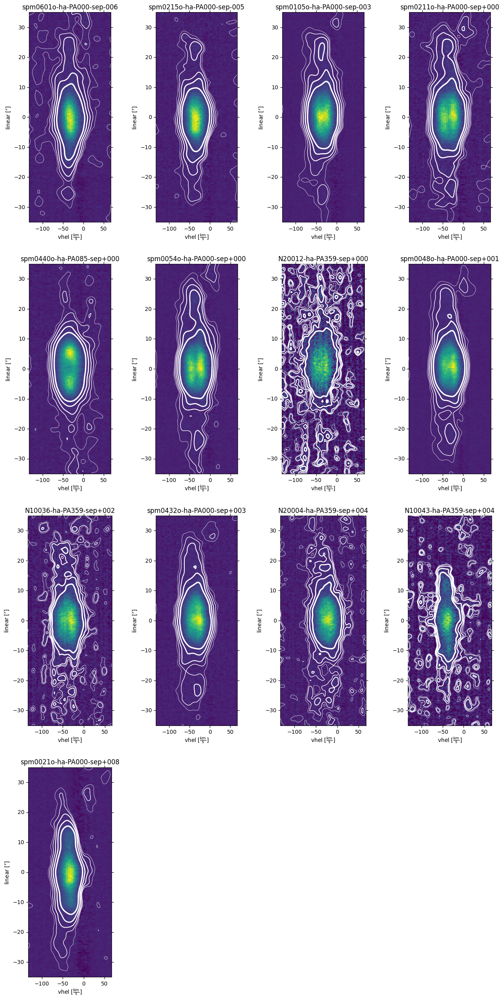

In [33]:
file_list = sorted(pvpath.glob("*-ha-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(4 * ncols, 8 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=2.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    bg1 = np.median(hdu.data[y1-10:y1], axis=0)
    bg2 = np.median(hdu.data[y2:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    im /= im.max()
    ax.imshow(im, vmin=-0.1, vmax=1.0)
    ims = convolve_fft(im, kernel)
    ax.contour(
        ims, 
        levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
        colors="w",
        linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    )

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem)
...;

Fit gaussian to profile along horizontal slit

In [34]:
w

WCS Keywords

Number of WCS axes: 2
CTYPE : 'VHEL' 'LINEAR' 
CRVAL : -213.61070165716 0.0 
CRPIX : 1.0 478.0 
PC1_1 PC1_2  : 1.0 0.0 
PC2_1 PC2_2  : 0.0 1.0 
CDELT : 3.7737766714679 0.52645149331988 
NAXIS : 121  657

In [35]:
filepath = file_list[4]
hdu, = fits.open(filepath)
w = WCS(hdu.header)
ny, nx = hdu.data.shape
_, yy = w.array_index_to_world(np.arange(ny), [0] * ny)
yy

<Quantity [-237.24769372, -236.72164562, -236.19559751, -235.66954941,
           -235.14350131, -234.61745321, -234.09140511, -233.56535701,
           -233.03930891, -232.51326081, -231.9872127 , -231.4611646 ,
           -230.9351165 , -230.4090684 , -229.8830203 , -229.3569722 ,
           -228.8309241 , -228.30487599, -227.77882789, -227.25277979,
           -226.72673169, -226.20068359, -225.67463549, -225.14858739,
           -224.62253928, -224.09649118, -223.57044308, -223.04439498,
           -222.51834688, -221.99229878, -221.46625068, -220.94020258,
           -220.41415447, -219.88810637, -219.36205827, -218.83601017,
           -218.30996207, -217.78391397, -217.25786587, -216.73181776,
           -216.20576966, -215.67972156, -215.15367346, -214.62762536,
           -214.10157726, -213.57552916, -213.04948105, -212.52343295,
           -211.99738485, -211.47133675, -210.94528865, -210.41924055,
           -209.89319245, -209.36714435, -208.84109624, -208.31504814,
      

In [36]:
_, [i1, i2] = w.world_to_array_index_values([-70, 0], [0, 0])
i1, i2, _

(42, 60, array([451, 451]))

In [37]:
from astropy.modeling import models, fitting

(-25.0, 25.0)

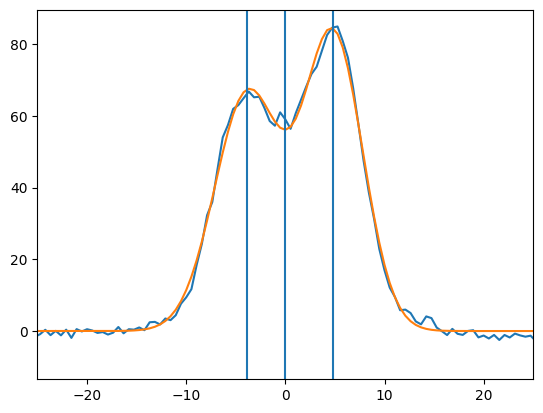

In [38]:
fig, ax = plt.subplots()
profile = np.mean(hdu.data[:, i1:i2], axis=1)
profile -= np.median(profile)
g1 = models.Gaussian1D(amplitude=50, mean=-4, stddev=4)
g2 = models.Gaussian1D(amplitude=70, mean=5, stddev=4)
init_model = g1 + g2
mask = np.abs(yy) < 25 * u.arcsec
fitter = fitting.LevMarLSQFitter()
fitted_model = fitter(init_model, yy[mask], profile[mask])
gg1, gg2 = fitted_model
ax.plot(yy, profile)
ax.plot(yy, fitted_model(yy))
ax.axvline(0)
ax.axvline(gg1.mean.value)
ax.axvline(gg2.mean.value)

ax.set_xlim(-25, 25)

Calculate offset between the two peaks:

In [39]:
gg2.mean - gg1.mean

<Quantity 8.64540943 arcsec>

In [40]:
for filepath in file_list:
    hdu, = fits.open(filepath)
    hdu2 = mes.regrid_pv(hdu, pixscale=(2.0, 1.0))
    filepath2 = pvpath2 / f"{filepath.stem}-regrid.fits" 
    hdu2.writeto(filepath2, overwrite=True)

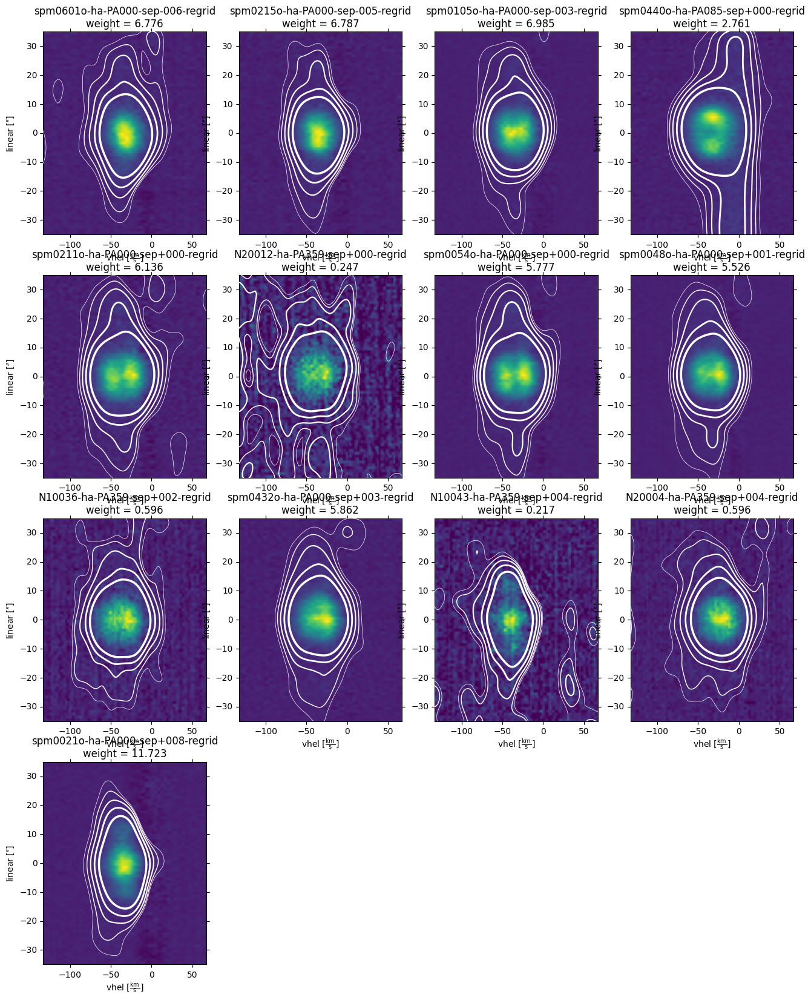

In [41]:
file_list = sorted(pvpath2.glob("*-ha-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(4 * ncols, 5 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=4.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    bg1 = np.median(hdu.data[y1-10:y1], axis=0)
    bg2 = np.median(hdu.data[y2:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    im /= im.max()
    ax.imshow(im, vmin=-0.1, vmax=1.0, aspect="auto")
    ims = convolve_fft(im, kernel)
    ax.contour(
        ims, 
        levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
        colors="w",
        linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    )

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem + f"\nweight = {hdu.header['WEIGHT']:.3f}")
...;

In [42]:
selected = 2, 4, 5, 6, 7, 8, 9
imlist = []
weightsum = 0.0

for isel in selected:
    hdu, = fits.open(file_list[isel])
    weight =  hdu.header["WEIGHT"]
    imlist.append(weight * hdu.data)
    weightsum += weight
    
hdu.data = np.sum(np.stack(imlist, axis=0), axis=0) / weightsum
hdu.writeto(pvpath2 / "ha-pv-coadd.fits", overwrite=True)

## Repeat for He II and [N II]

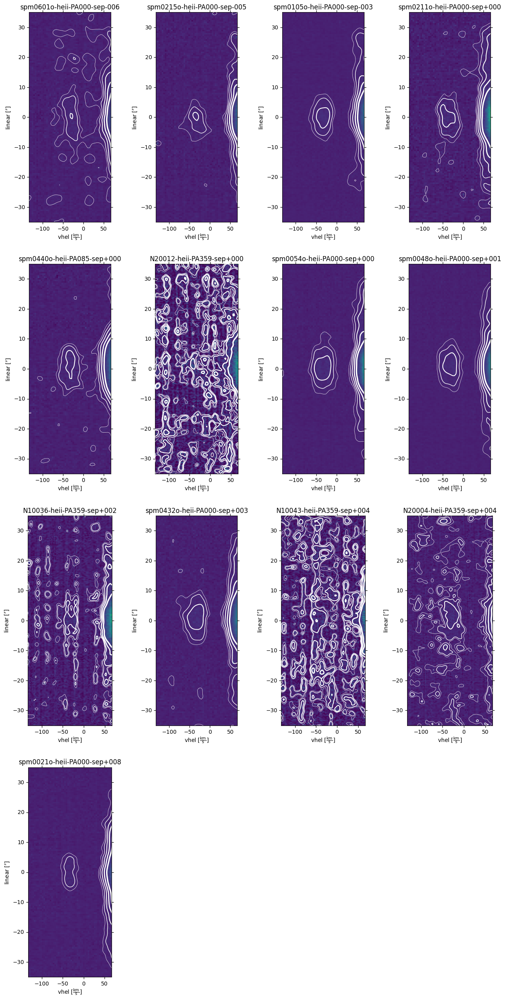

In [43]:
file_list = sorted(pvpath.glob("*-heii-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(4 * ncols, 8 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=2.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    bg1 = np.median(hdu.data[y1-10:y1], axis=0)
    bg2 = np.median(hdu.data[y2:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    im /= im.max()
    ax.imshow(im, vmin=-0.1, vmax=1.0)
    ims = convolve_fft(im, kernel)
    ax.contour(
        ims, 
        levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
        colors="w",
        linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    )

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem)
...;

In [44]:
for filepath in file_list:
    hdu, = fits.open(filepath)
    hdu2 = mes.regrid_pv(hdu)
    hdu2 = mes.regrid_pv(hdu, pixscale=(2.0, 1.0))
    filepath2 = pvpath2 / f"{filepath.stem}-regrid.fits" 
    hdu2.writeto(filepath2, overwrite=True)

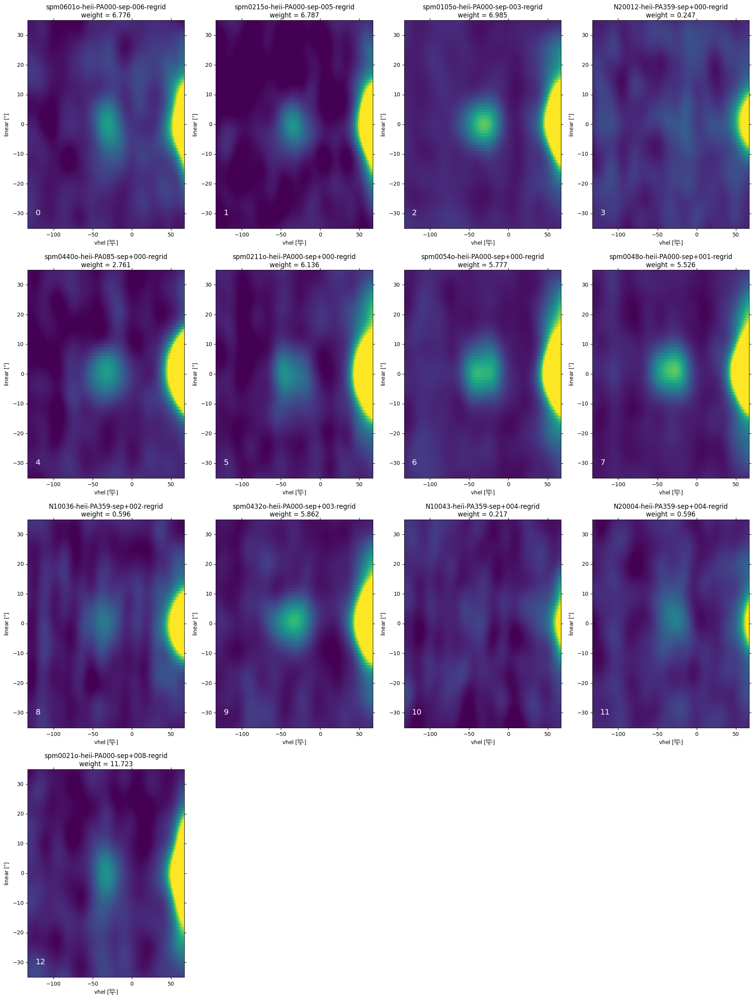

In [45]:
file_list = sorted(pvpath2.glob("*-heii-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(6 * ncols, 8 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=4.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    x1, x2 = [int(_) for _ in xlims]
    x0, y0 = w.world_to_pixel_values(0.0, 0.0)
    x0 = int(x0)
    bg1 = np.median(hdu.data[y1-10:y1], axis=0)
    bg2 = np.median(hdu.data[y2:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    scale = np.percentile(im[y1:y2, x1:x0], 99)
    im /= scale
    ims = convolve_fft(im, kernel)
    ax.imshow(ims, vmin=-0.1, vmax=1.0, aspect="auto")
    #ax.contour(
    #    ims, 
    #    levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
    #    colors="w",
    #    linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    #)

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem + f"\nweight = {hdu.header['WEIGHT']:.3f}")
    ax.text(x1 + 5, y1 + 5, f"{i}", color="w", fontsize="x-large")
...;

In [46]:
selected = 2, 4, 5, 6, 7, 8, 9
imlist = []
weightsum = 0.0

for isel in selected:
    hdu, = fits.open(file_list[isel])
    weight =  hdu.header["WEIGHT"]
    imlist.append(weight * hdu.data)
    weightsum += weight
    
hdu.data = np.sum(np.stack(imlist, axis=0), axis=0) / weightsum
hdu.writeto(pvpath2 / "heii-pv-coadd.fits", overwrite=True)

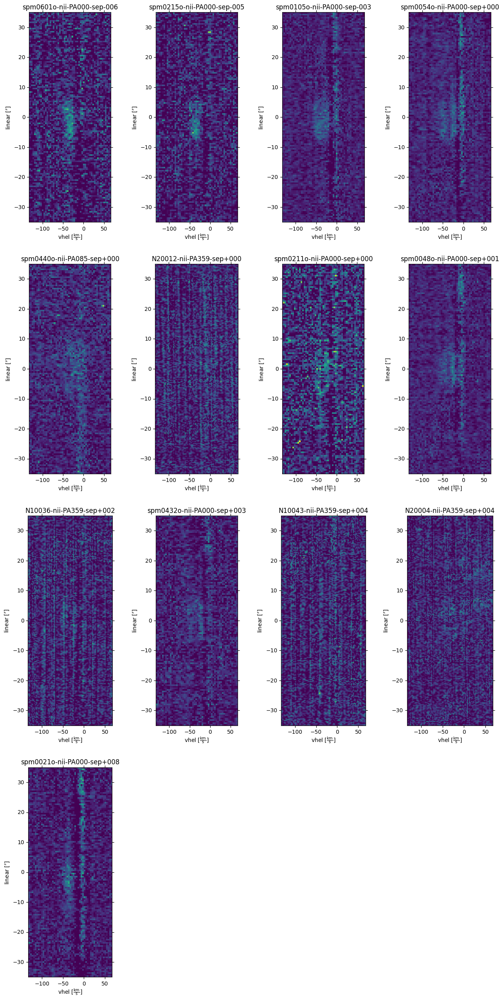

In [47]:
file_list = sorted(pvpath.glob("*-nii-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(4 * ncols, 8 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=2.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    bg1 = np.median(hdu.data[y1-10:y1], axis=0)
    bg2 = np.median(hdu.data[y2:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    im /= im.max()
    ax.imshow(im, vmin=-0.1, vmax=1.0)
    ims = convolve_fft(im, kernel)
#    ax.contour(
#        ims, 
#        levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
#        colors="w",
#        linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
#    )

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem)
...;

In [48]:
for filepath in file_list:
    hdu, = fits.open(filepath)
    hdu2 = mes.regrid_pv(hdu, pixscale=(2.0, 1.0))
    filepath2 = pvpath2 / f"{filepath.stem}-regrid.fits" 
    hdu2.writeto(filepath2, overwrite=True)

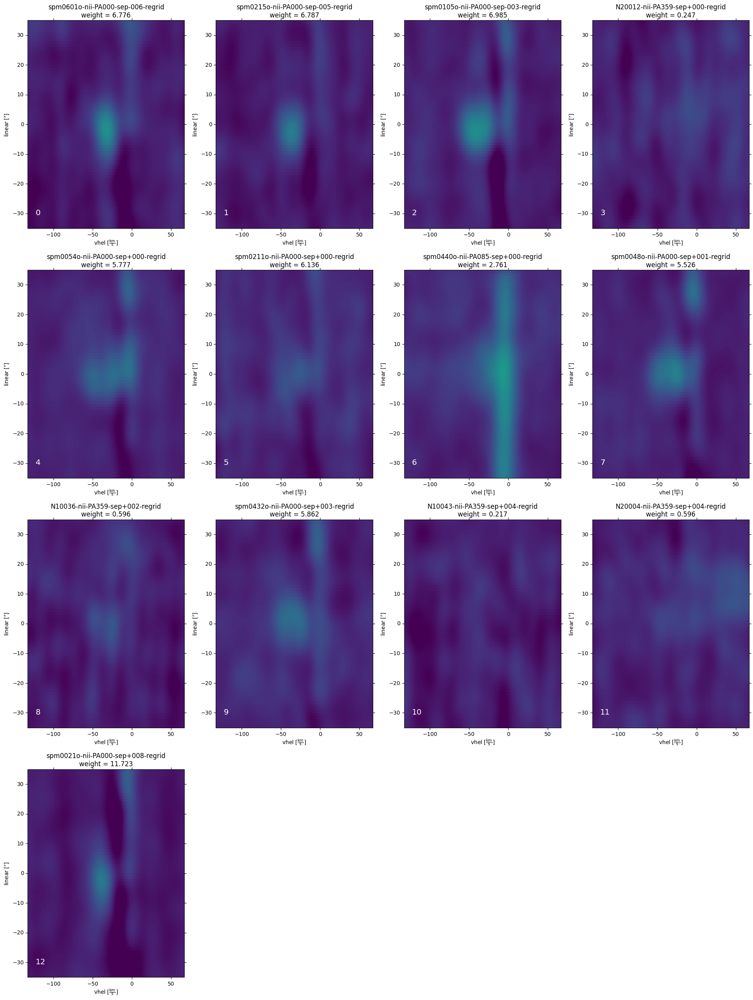

In [49]:
file_list = sorted(pvpath2.glob("*-nii-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(6 * ncols, 8 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=4.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    x1, x2 = [int(_) for _ in xlims]
    x0, y0 = w.world_to_pixel_values(0.0, 0.0)
    x0 = int(x0)
    bg1 = np.median(hdu.data[y1-10:y1], axis=0)
    bg2 = np.median(hdu.data[y2:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    scale = np.percentile(im[y1:y2, x1:x0], 99.9)
    im /= scale
    ims = convolve_fft(im, kernel)
    ax.imshow(ims, vmin=-0.1, vmax=1.0, aspect="auto")
    #ax.contour(
    #    ims, 
    #    levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
    #    colors="w",
    #    linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    #)

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem + f"\nweight = {hdu.header['WEIGHT']:.3f}")
    ax.text(x1 + 5, y1 + 5, f"{i}", color="w", fontsize="x-large")
...;

In [50]:
selected = 2, 4, 5, 6, 7, 8, 9
imlist = []
weightsum = 0.0

for isel in selected:
    hdu, = fits.open(file_list[isel])
    weight =  hdu.header["WEIGHT"]
    imlist.append(weight * hdu.data)
    weightsum += weight
    
hdu.data = np.sum(np.stack(imlist, axis=0), axis=0) / weightsum
hdu.writeto(pvpath2 / "nii-pv-coadd.fits", overwrite=True)

## Look at our co-added spectra

In [51]:
import seaborn as sns
sns.set_context("talk")

Update this to be more similar to what we do for oiii in the 04-02 notebook. Write the normalized bg-subtracted images first 

In [52]:
file_list = sorted(pvpath2.glob("*-pv-coadd.fits"))

N = len(file_list)

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

contours = "oiii", "ha"
kernel = Gaussian2DKernel(x_stddev=2.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    x1, x2 = [int(_) for _ in xlims]
    x0, y0 = w.world_to_pixel_values(0.0, 0.0)
    x0 = int(x0)
    bg1 = np.median(hdu.data[y1-10:y1], axis=0)
    bg2 = np.median(hdu.data[y2:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    scale = np.percentile(im[y1:y2, x1:x0], 99.99)
    im /= scale
    # Save a FITS file of BG-subtracted and normalized image
    fits.PrimaryHDU(
        header=hdu.header,
        data=im,
    ).writeto(
        str(filepath).replace(".fits", "-bgsub.fits"),
        overwrite=True,
    )

And then do the plot separately

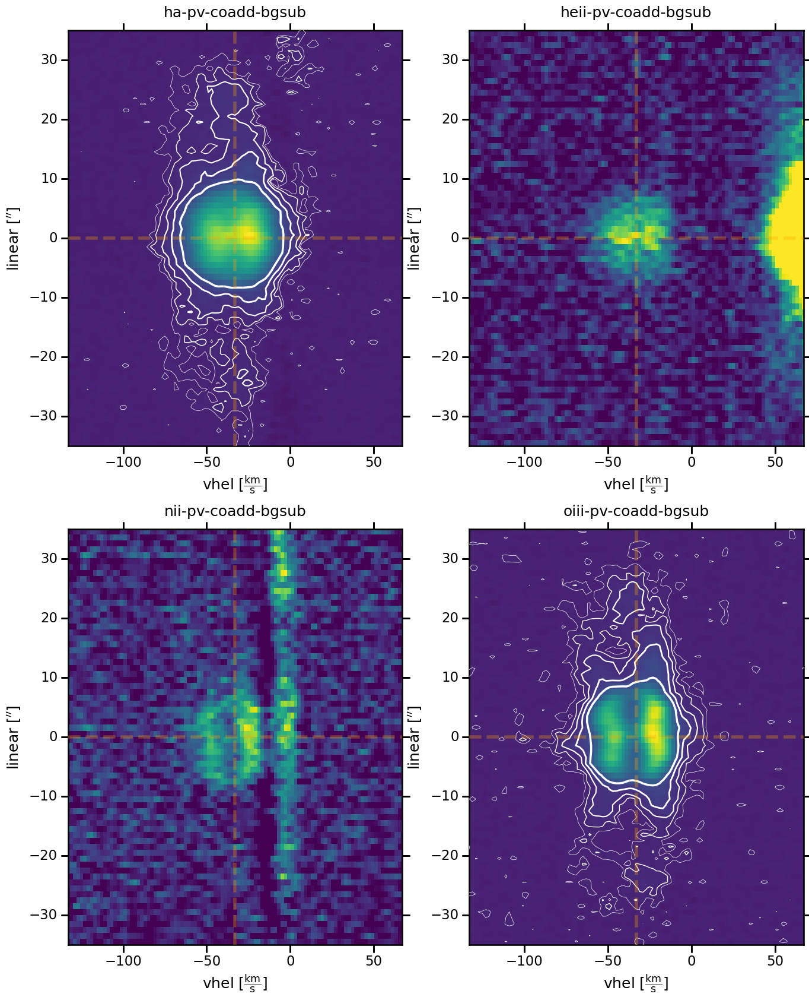

In [66]:
file_list = sorted(pvpath2.glob("*-pv-coadd-bgsub.fits"))

N = len(file_list)
ncols = 2
nrows = (N // ncols)
fig = plt.figure(figsize=(8 * ncols, 10 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

contours = "oiii", "ha"
kernel = Gaussian2DKernel(x_stddev=0.1)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    im = hdu.data
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    x1, x2 = [int(_) for _ in xlims]
    ax.imshow(im, vmin=-0.1, vmax=1.0, aspect="auto")
    # ims = convolve_fft(im, kernel)
    if filepath.stem.startswith(contours):
        ax.contour(
            im, 
            levels=[0.01, 0.02, 0.04, 0.08, 0.16], 
            colors="w",
            linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
        )
    x0, y0 = w.world_to_pixel_values(vsys, 0.0)
    ax.axhline(y0, color="orange", ls="dashed", lw=4, alpha=0.3)
    ax.axvline(x0, color="orange", ls="dashed", lw=4, alpha=0.3)
    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem, pad=16)
figfile = "ou5-coadd-2dspec.pdf"
fig.savefig(figfile)
fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")
...;

And do the spatial profiles along the slit

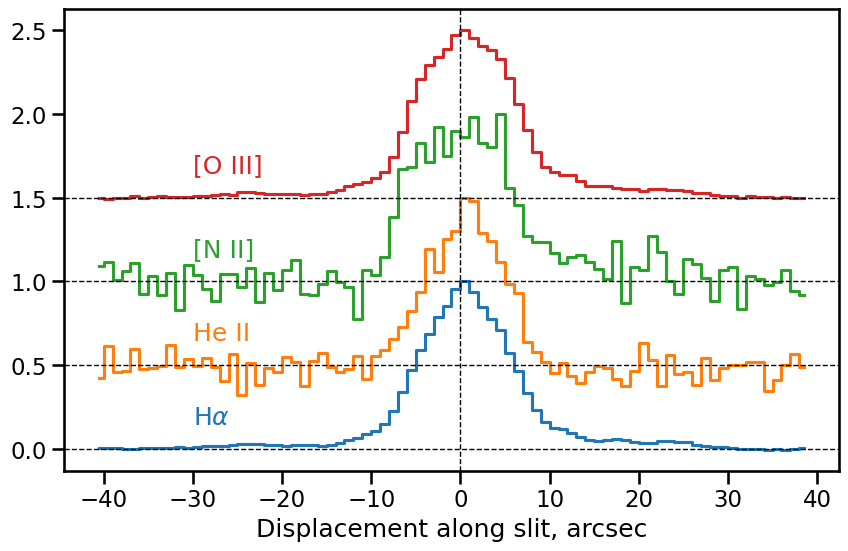

In [64]:
fig, ax = plt.subplots(
    figsize=(10, 6),
)
labels = {
    "oiii": "[O III]",
    "ha": r"H$\alpha$",
    "nii": "[N II]",
    "heii": "He II",
}
vsys = -33
v1, v2 = -75, -10
s1, s2 = -40, 40
offset = 0.0
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    line_label = filepath.stem.split("-")[0]
    im = hdu.data
    w = WCS(hdu.header)
    ns, nv = hdu.data.shape
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    x1, x2 = [int(_) for _ in xlims]
    y1, y2 = [int(_) for _ in ylims]
    profile = hdu.data[y1:y2, x1:x2].mean(axis=1)
    _, pos = w.pixel_to_world_values([0]*ns, np.arange(ns))
    pos = pos[y1:y2]
    profile *= 1/ np.max(profile)
    line, = ax.plot(pos, profile + offset, label=line_label, ds="steps-mid")
    ax.text(-30, offset + 0.15, labels[line_label], color=line.get_color())
    ax.axhline(offset, linestyle="dashed", c="k", lw=1,)
    offset += 0.5
ax.axvline(0.0, linestyle="dashed", c="k", lw=1,)
#ax.legend(ncol=2)
ax.set(
    xlabel="Displacement along slit, arcsec",
)
figfile = "ou5-coadd-spatial-profiles-1d.pdf"
fig.savefig(figfile)
fig.savefig(figfile.replace(".pdf", ".jpg"))
...;

In [55]:
pos

array([-40.5, -39.5, -38.5, -37.5, -36.5, -35.5, -34.5, -33.5, -32.5,
       -31.5, -30.5, -29.5, -28.5, -27.5, -26.5, -25.5, -24.5, -23.5,
       -22.5, -21.5, -20.5, -19.5, -18.5, -17.5, -16.5, -15.5, -14.5,
       -13.5, -12.5, -11.5, -10.5,  -9.5,  -8.5,  -7.5,  -6.5,  -5.5,
        -4.5,  -3.5,  -2.5,  -1.5,  -0.5,   0.5,   1.5,   2.5,   3.5,
         4.5,   5.5,   6.5,   7.5,   8.5,   9.5,  10.5,  11.5,  12.5,
        13.5,  14.5,  15.5,  16.5,  17.5,  18.5,  19.5,  20.5,  21.5,
        22.5,  23.5,  24.5,  25.5,  26.5,  27.5,  28.5,  29.5,  30.5,
        31.5,  32.5,  33.5,  34.5,  35.5,  36.5,  37.5,  38.5])

### Some comments on the results

Components

#### Inner lobes

Red component is brighter than blue.

#### Outer lobes

Bend towards blue on both sides (N and S)

#### Equatorial high velocity wings
More obvious in oiii. 

#### Polar knots




That seems to have worked fine.  Now we will try it with a pre-defined common grid. Say, 1 km/s and 0.2 arcsec.

Helium lines. Not very good.

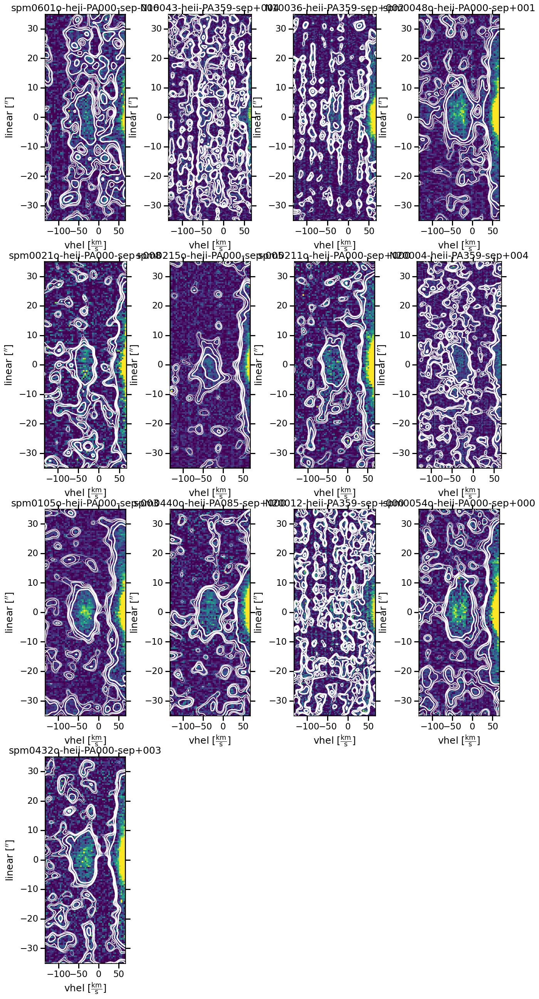

In [56]:
file_list = list(pvpath.glob("*-heii-*.fits"))
N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(4 * ncols, 8 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=2.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    x1, x2 = [int(_) for _ in xlims]
    bg1 = np.median(hdu.data[y1-10:y1], axis=0)
    bg2 = np.median(hdu.data[y2:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    x0, _ = w.world_to_pixel_values(0.0, 0.0)
    x0 = int(x0)
    im /= im[y1:y2, x1:x0].max()
    ax.imshow(im, vmin=-0.1, vmax=1.0)
    ims = convolve_fft(im, kernel)
    ax.contour(
        ims, 
        levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
        colors="w",
        linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    )

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem)
...;

In [57]:
x1, x2, x0

(26, 77, 60)

In [58]:
y1, y2

(255, 388)

In [59]:
im[y1:y2, x1:x2].max()

3.3866057